# Register MRI data

In [1]:
import numpy as np
import nibabel as nib
import glob
from pprint import pprint
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import SimpleITK as sitk
from scipy.ndimage import binary_fill_holes
import ants

## Functions

In [23]:
import time 

def n4_bias_correction(img, bg_mask, shrink_factor: float=15, show: bool=False) -> np.ndarray:
    """
    N4 bias correction for the input image.
    
    Parameters:
    - img: The input image to correct.
    - alpha: The alpha value for contrast adjustment.
    - shrink_factor: The shrink factor for downsampling the image for bias correction.
    - show: Whether to show the intermediate results.
    
    Returns:
    - corrected_image_full_resolution: The bias corrected image.
    """ 
    # Create the brain tissue mask
    bg_mask = bg_mask.astype(np.uint8)
    mask_img = sitk.GetImageFromArray(bg_mask)
    mask_img = sitk.LiThreshold(mask_img, 0, 1)

    # Use the raw image and convert it to float32
    raw_img = sitk.GetImageFromArray(img.copy())
    raw_img = sitk.Cast(raw_img, sitk.sitkFloat32)

    # Downsample it for bias correction
    inputImage = raw_img
    if shrink_factor > 1:
        inputImage = sitk.Shrink( raw_img, [ shrink_factor ] * raw_img.GetDimension() ) #2
        maskImage = sitk.Shrink( mask_img, [ shrink_factor ] * inputImage.GetDimension() ) #3
    else:
        inputImage = raw_img
        maskImage = mask_img

    # Run bias correction
    start_time = time.time()
    bias_corrector = sitk.N4BiasFieldCorrectionImageFilter()
    corrected = bias_corrector.Execute(inputImage, maskImage)
    
    # Apply bias correction to full resolution image
    log_bias_field = bias_corrector.GetLogBiasFieldAsImage(raw_img)
    corrected_image_full_resolution = raw_img / sitk.Exp(log_bias_field)
    end_time = time.time()
    corrected_image_full_resolution = sitk.GetArrayFromImage(corrected_image_full_resolution)
    
    # Show the process if True
    if show:
        print(f"Time taken for bias correction: {end_time - start_time:.2f} seconds")
        
        # Show the brain tissue mask
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(sitk.GetArrayFromImage(mask_img), cmap='gray')
        plt.title(f"Full resolution brain mask")
        plt.subplot(1, 2, 2)
        plt.imshow(sitk.GetArrayFromImage(maskImage), cmap='gray')
        plt.title(f"Downsampled brain mask (shrink factor={shrink_factor})")
        plt.show()
        
        # Show the log bias field
        plt.figure(figsize=(10, 5))
        plt.imshow(sitk.GetArrayFromImage(log_bias_field))
        plt.colorbar()
        plt.title(f"Log bias field")
        plt.show()

        # Show the corrected bias field image
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(img, cmap='gray')
        plt.title(f"Original raw image")
        plt.subplot(1, 2, 2)
        plt.imshow(corrected_image_full_resolution, cmap='gray')
        plt.title(f"Corrected bias raw image")
        plt.show()

        # Increase the contrast of the corrected image and show side-by-side
        preview_alpha = 0.25
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(img, cmap='gray')
        plt.title(f"Original contrast image (alpha={preview_alpha})")
        plt.subplot(1, 2, 2)
        plt.imshow(corrected_image_full_resolution, cmap='gray')
        plt.title(f"Corrected bias contrast image (alpha={preview_alpha})")
        plt.show()
        
    return corrected_image_full_resolution


def show_slice(data: np.ndarray, idx: int, title: str = "") -> None:
    """
    Show a slice of the data.
    
    Parameters:
    - data: The processed data.
    - idx: The index of the slice to show.
    - title: The title for the plot.
    """
    f = plt.figure(figsize=(10, 5))
    plt.imshow(data[idx, :, :], cmap='gray')
    plt.title(title)
    plt.show()
    f.clear()
    plt.close(f)


def show_2_slices(data1: np.ndarray, idx1: int, segmentation1: np.ndarray, 
                  data2: np.ndarray, idx2: int, segmentation2: np.ndarray = None,
                  cmap1="gray", cmap2="gray",
                  title1: str = "", title2: str = "") -> None:
    """
    Show two slices of the data and segmentation.
    
    Parameters:
    - data: The processed data.
    - segmentation: The segmentation mask.
    - original_data: The original data.
    - idx: The index of the slice to show.
    - title: The title for the plot.
    """
    f, ax = plt.subplots(1, 2, figsize=(20, 10))
    # Original slice
    ax[0].imshow(data1[idx1, :, :], cmap=cmap1)
    if segmentation1 is not None:
        ax[0].contour(segmentation1[idx1, :, :], levels=[0.5], colors='r')
    ax[0].set_title(title1)
    # Processed slice
    ax[1].imshow(data2[idx2, :, :], cmap=cmap2)
    if segmentation2 is not None:
        ax[1].contour(segmentation2[idx2, :, :], levels=[0.5], colors='r')
    ax[1].set_title(title2)
    plt.show()
    f.clear()
    plt.close(f)
    
    
def show_3_slices(data1: np.ndarray, idx1: int, segmentation1: np.ndarray, 
                  data2: np.ndarray, idx2: int, 
                  data3: np.ndarray, idx3: int,
                  title1: str = "", title2: str = "", title3: str = "") -> None:
    """
    Show three slices of the data and segmentation.
    
    Parameters:
    - data: The processed data.
    - segmentation: The segmentation mask.
    - original_data: The original data.
    - idx: The index of the slice to show.
    - title: The title for the plot.
    """
    f, ax = plt.subplots(1, 3, figsize=(20, 10))
    # Original slice
    ax[0].imshow(data1[idx1, :, :], cmap='gray')
    ax[0].contour(segmentation1[idx1, :, :], levels=[0.5], colors='r')
    ax[0].set_title(title1)
    # Processed slice
    ax[1].imshow(data2[idx2, :, :], cmap='gray')
    ax[1].set_title(title2)
    # Atlas color segmentation
    ax[2].imshow(data3[idx3, :, :])
    ax[2].set_title(title3)
    plt.show()
    f.clear()
    plt.close(f)
    
    
def export_gif(volume: np.ndarray, output_path: str, fps: int = 15, cmap='gray') -> None:
    def update(i):
        # Clear the previous frame
        plt.clf()
        # Plot the data for the current frame (e.g., using plt.imshow for images)
        plt.imshow(volume[i], cmap=cmap) # Assuming 'images' is a list of image arrays
        plt.title(f"Frame {i+1}")
    
    fig, _ = plt.subplots()
    ani = animation.FuncAnimation(fig, update, frames=len(volume), interval=50, repeat_delay=1000)
    writer = animation.PillowWriter(fps=fps) # or animation.ImageMagickWriter()
    ani.save(output_path, writer=writer)
    plt.close(fig)
    
    
    
from PIL import Image
import numpy as np

def resize_and_pad_grayscale_np(image_array, scale, target_size):
    """
    Resize a grayscale NumPy image array by a scale factor, then pad with zeros to match target size.

    Args:
        image_array (np.ndarray): Grayscale image as a 2D NumPy array (H, W).
        scale (float): Scale factor.
        target_size (tuple): (height, width) of the final output image.

    Returns:
        np.ndarray: Resized and padded image as a 2D NumPy array.
    """
    # Convert NumPy array to PIL Image
    image = Image.fromarray(image_array)

    # Resize
    new_width = int(image.width * scale)
    new_height = int(image.height * scale)
    resized = image.resize((new_width, new_height), Image.BILINEAR)

    # Create new padded image
    target_height, target_width = target_size
    padded_image = Image.new("F", (target_width, target_height), 0)

    # Compute paste position
    left = (target_width - new_width) // 2
    top = (target_height - new_height) // 2

    padded_image.paste(resized, (left, top))

    # Convert back to NumPy array
    return np.array(padded_image)


from matplotlib.colors import ListedColormap
from scipy.ndimage import center_of_mass, label


def show_labels(idx: int, image: np.ndarray, labels: np.ndarray, alpha: float = 0.5, title: str = ""):
    curr_img = image[idx, :, :]
    curr_label = labels[idx, :, :]
    
    # Generate a custom colormap with enough unique colors
    unique_values = np.unique(curr_label)
    num_labels = len(unique_values)
    np.random.seed(142)  # For reproducibility
    colors = np.random.rand(num_labels - 1, 3)  # Generate random RGB colors
    colors = np.vstack([[0, 0, 0], colors])  # Ensure 0 is always black
    custom_cmap = ListedColormap(colors)

    # Registration output without overlay
    f = plt.figure(figsize=(10, 10))
    plt.imshow(curr_img, cmap='gray')
    plt.title(title + f" (slice {idx})")
    # Overlay boundaries for each unique value in atlas_label
    for value in unique_values:
        if value == 0:  # Skip background
            continue
        plt.contour(curr_label == value, 
                    levels=[0.5], colors='r', linewidths=1, alpha=alpha)
        
        # Compute the center of mass for the current label
        mask = curr_label == value
        # Label connected components in the mask
        labeled_components, num_components = label(mask)

        # Compute the center of mass for each connected component
        for component_idx in range(1, num_components + 1):
            component_mask = labeled_components == component_idx
            center = center_of_mass(component_mask)

            # Add the label index at the center of the region
            plt.text(center[1], center[0], str(int(value)), color='white', fontsize=6, ha='center', va='center')
            plt.text(center[1], center[0], str(int(value)), color='white', fontsize=6, ha='center', va='center')


        
    plt.imshow(curr_label, cmap=custom_cmap, alpha=alpha)  # Use a colormap like 'tab20'
    plt.show()
    f.clear()
    plt.close(f)
    
    
def export_gif_with_labels(volume: np.ndarray, annotation: np.ndarray, output_path: str, alpha: float = 0.5, fps: int = 15, fontsize=6, cmap='gray') -> None:
    
    def update(i):
        curr_img = volume[i, :, :]
        curr_label = annotation[i, :, :]
        
        # Generate a custom colormap with enough unique colors
        unique_values = np.unique(curr_label)
        num_labels = len(unique_values)
        np.random.seed(142)  # For reproducibility
        colors = np.random.rand(num_labels - 1, 3)  # Generate random RGB colors
        colors = np.vstack([[0, 0, 0], colors])  # Ensure 0 is always black
        custom_cmap = ListedColormap(colors)
        
        # Clear the previous frame
        plt.clf()
        # Plot the data for the current frame (e.g., using plt.imshow for images)
        plt.imshow(curr_img, cmap=cmap) # Assuming 'images' is a list of image arrays
        
        # Overlay boundaries for each unique value in atlas_label
        for value in unique_values:
            if value == 0:  # Skip background
                continue
            plt.contour(curr_label == value, 
                        levels=[0.5], colors='r', linewidths=1, alpha=alpha)
            
            
            if fontsize != 0:
                # Compute the center of mass for the current label
                mask = curr_label == value
                # Label connected components in the mask
                labeled_components, num_components = label(mask)

                # Compute the center of mass for each connected component
                for component_idx in range(1, num_components + 1):
                    component_mask = labeled_components == component_idx
                    center = center_of_mass(component_mask)

                    # Add the label index at the center of the region
                    plt.text(center[1], center[0], str(int(value)), color='white', fontsize=fontsize, ha='center', va='center')
                    plt.text(center[1], center[0], str(int(value)), color='white', fontsize=fontsize, ha='center', va='center')

            
        plt.title(f"Frame {i+1}")
    
    fig, _ = plt.subplots()
    ani = animation.FuncAnimation(fig, update, frames=len(volume), interval=50, repeat_delay=1000)
    writer = animation.PillowWriter(fps=fps) # or animation.ImageMagickWriter()
    ani.save(output_path, writer=writer)
    plt.close(fig)

## MRI AAVretro

Mask boundaries: x: 39 - 136, y: 33 - 104
Data path:
['../data/mri/Xu-AAVretro-M4/Xu_AAVretro_M4_0hrs.nii.gz',
 '../data/mri/Xu-AAVretro-M4/Xu_AAVretro_M4_24hrs.nii.gz',
 '../data/mri/Xu-AAVretro-M4/Xu_AAVretro_M4_2hrs.nii.gz',
 '../data/mri/Xu-AAVretro-M4/Xu_AAVretro_M4_48hrs.nii.gz',
 '../data/mri/Xu-AAVretro-M4/Xu_AAVretro_M4_72hrs.nii.gz',
 '../data/mri/Xu-AAVretro-M4/label']

Current data:
'../data/mri/Xu-AAVretro-M4/Xu_AAVretro_M4_2hrs.nii.gz'

Data shape:
(20, 170, 170)
Data type:
dtype('float64')

Atlas shape:
(528, 320, 456)


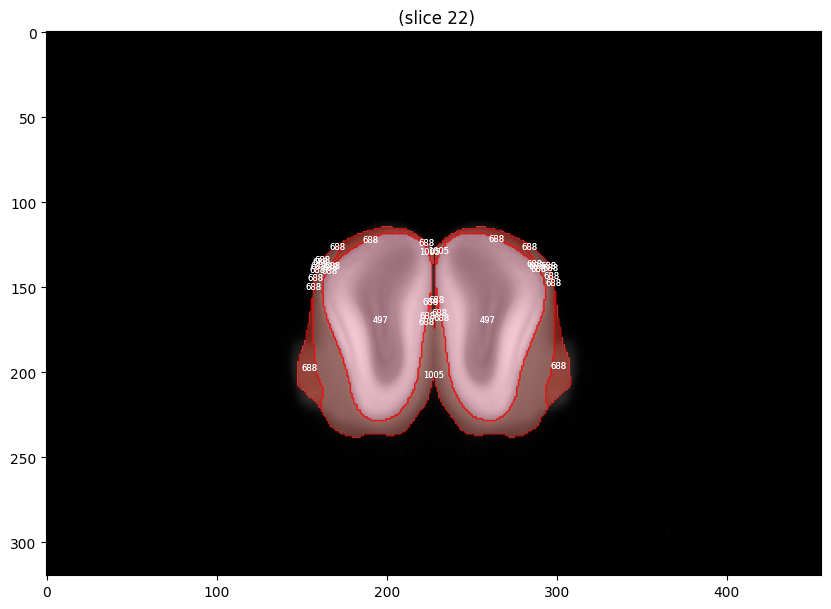

In [3]:
folder_path = "../data/mri/Xu-AAVretro-M4/*"
mask_path = "../data/mri/Xu-AAVretro-M4/label/AAVretro_M4_0hrs_test2.nii.gz"
data_path = sorted(glob.glob(folder_path))

# Load the atlas
atlas_path = "../../../CCF_DATA/average_template_25.nii.gz"
atlas = nib.load(atlas_path).get_fdata()

# Load atlas annotation
annotation_path = "../../../CCF_DATA/annotation_25.nii.gz"
annotation = nib.load(annotation_path).get_fdata()

# Select which data to use
current_data = data_path[2]

# Load the data and reorder the axes
data = nib.load(current_data).get_fdata()
data = np.transpose(data, (2, 1, 0))

# Load the segmentation mask
mask = nib.load(mask_path).get_fdata()
mask = np.transpose(mask, (2, 1, 0))

# Fill holes in the mask
mask = binary_fill_holes(mask > 0).astype(np.uint8)

# Perform N4 bias correction
data = n4_bias_correction(data, mask, shrink_factor=1, show=False)

# Mask over the data
data[mask == 0] = 0

# Get xmin, xmax, ymin, ymax boundaries of the mask
xmin, xmax = np.where(mask.sum(axis=(0, 1)) > 0)[0][[0, -1]]
ymin, ymax = np.where(mask.sum(axis=(0, 2)) > 0)[0][[0, -1]]
print(f"Mask boundaries: x: {xmin} - {xmax}, y: {ymin} - {ymax}")

# Print information about the data
print("Data path:")
pprint(data_path)

print("\nCurrent data:")
pprint(current_data)

print("\nData shape:")
pprint(data.shape)
print("Data type:")
pprint(data.dtype)

print("\nAtlas shape:")
pprint(atlas.shape)
show_labels(22, atlas, annotation, 0.5, "")  # Show an example


Resized shape:
(20, 320, 456)


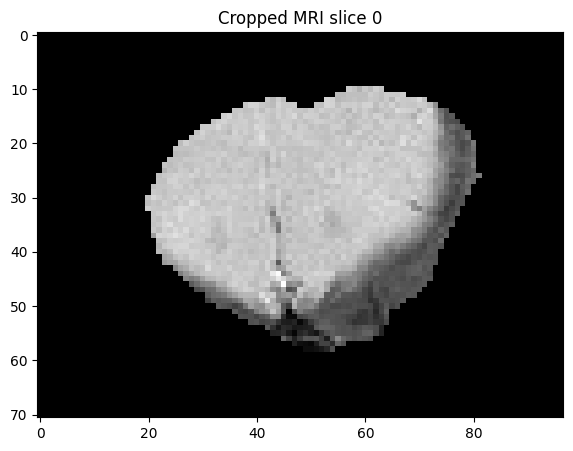

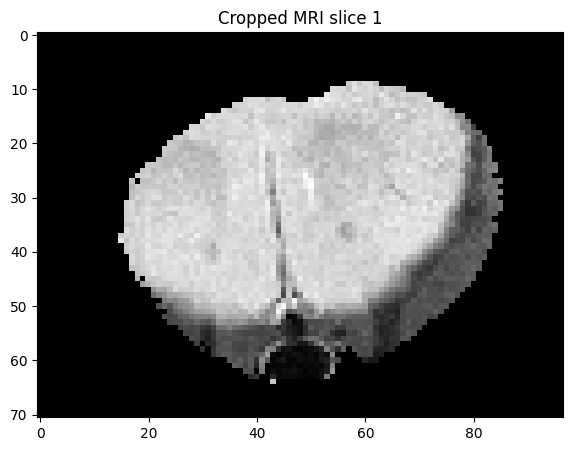

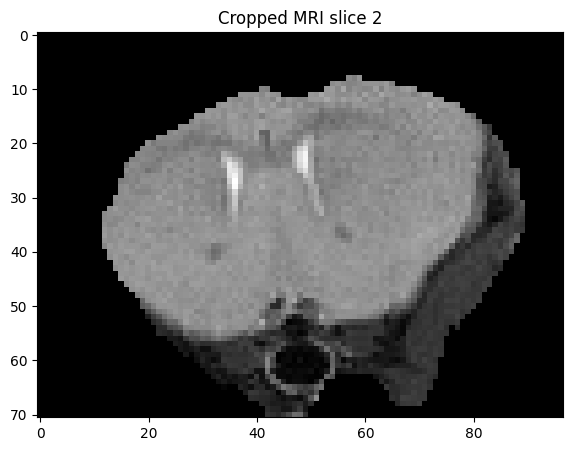

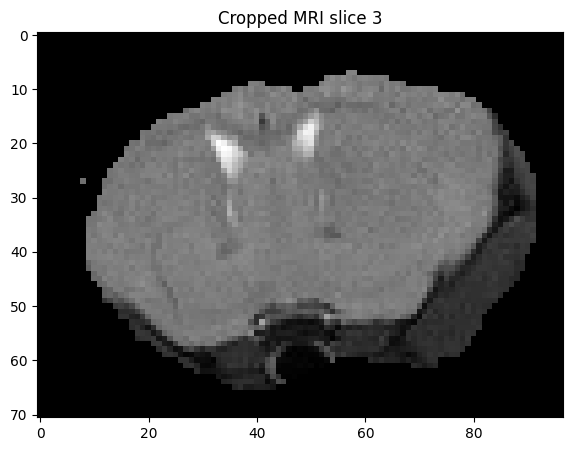

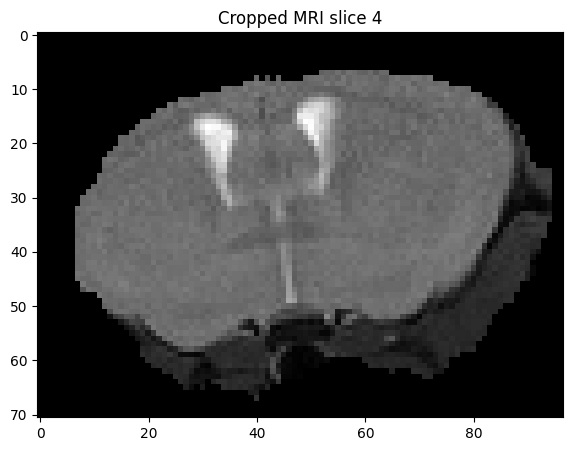

...

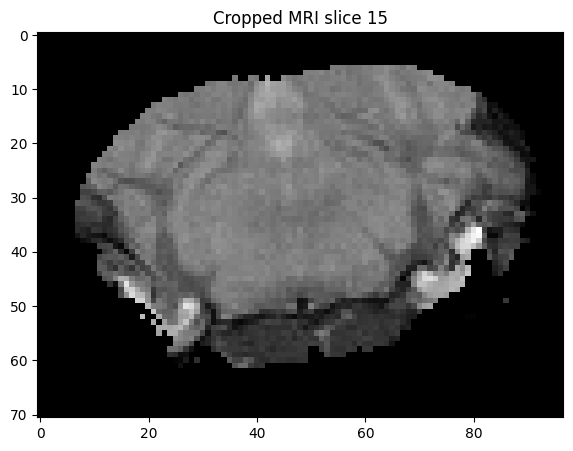

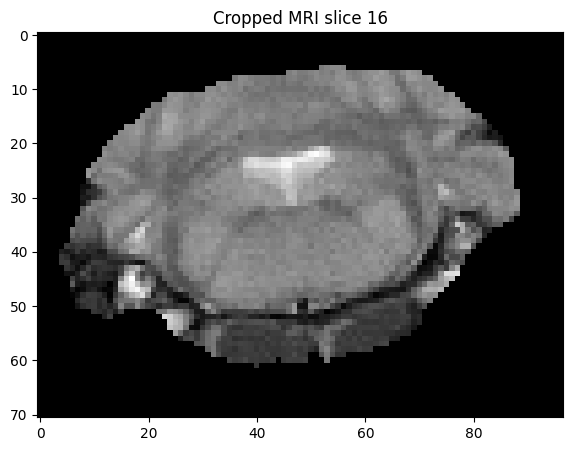

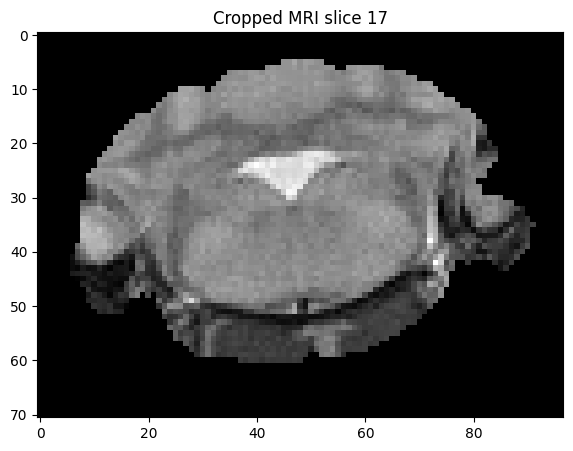

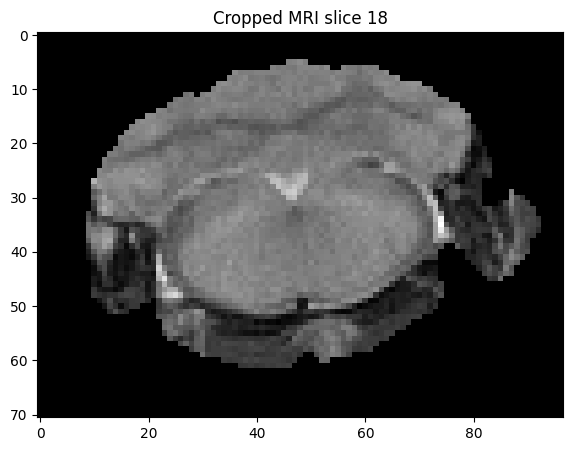

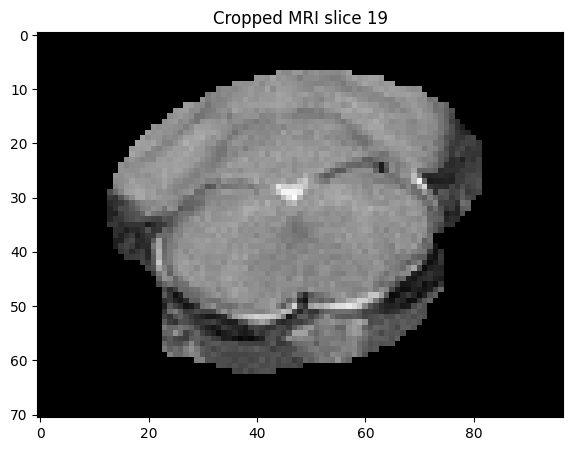

In [4]:
# Crop, pad, and resize data to be similar to the atlas
cropped_data = data.copy()[:, ymin:ymax, xmin:xmax]

resized = []
for i in range(0, len(cropped_data)):
    result_np = resize_and_pad_grayscale_np(cropped_data[i], scale=4, target_size=(320, 456))
    resized.append(result_np)

# Convert the list to a NumPy array
resized = np.array(resized)
print("\nResized shape:")
pprint(resized.shape)

# Show index
for idx in range(0, cropped_data.shape[0]):
    show_slice(cropped_data, idx, f"Cropped MRI slice {idx}")

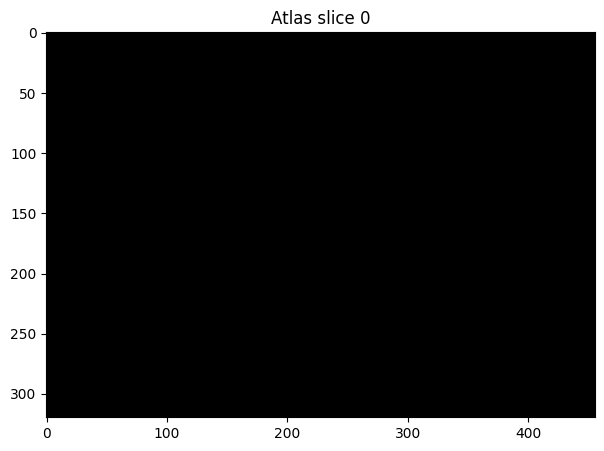

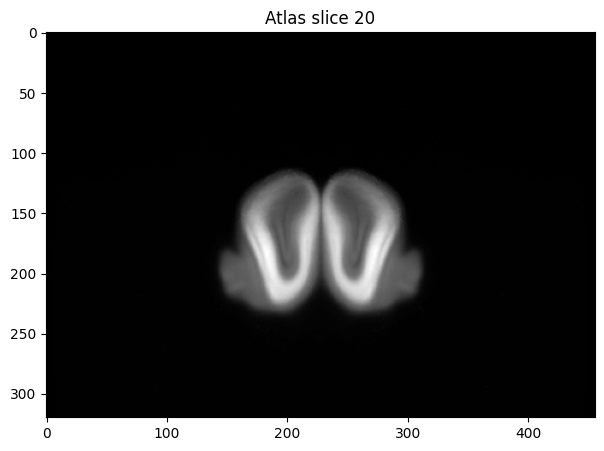

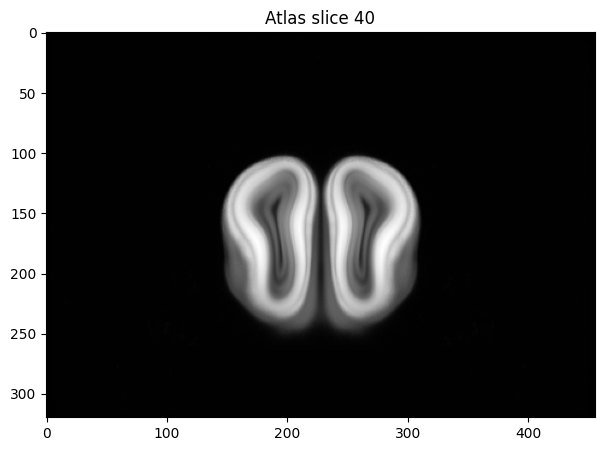

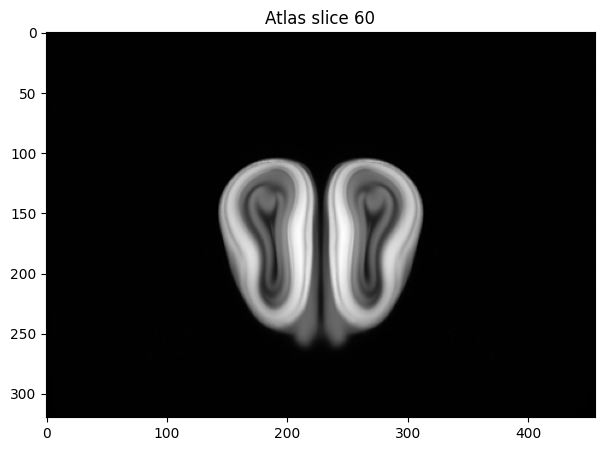

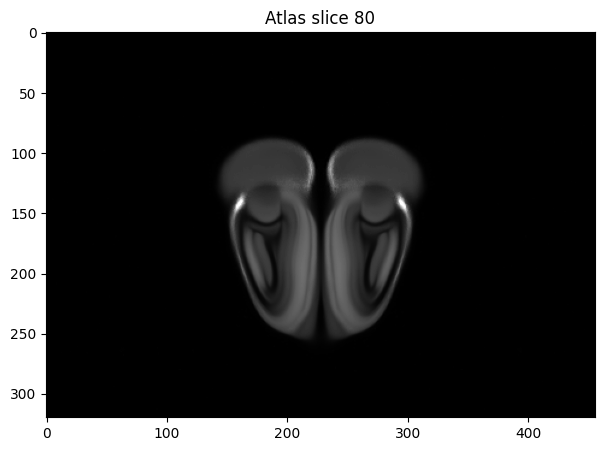

...

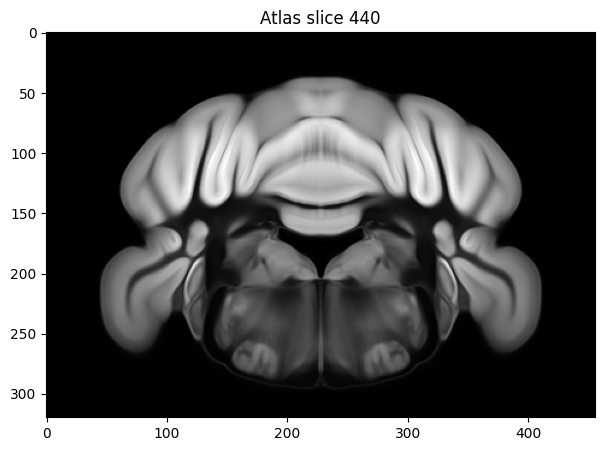

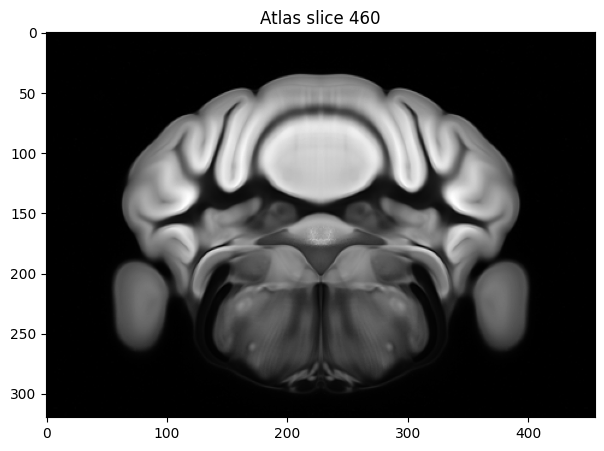

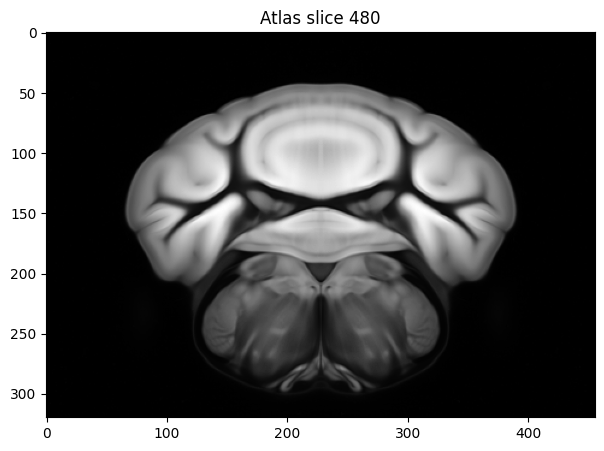

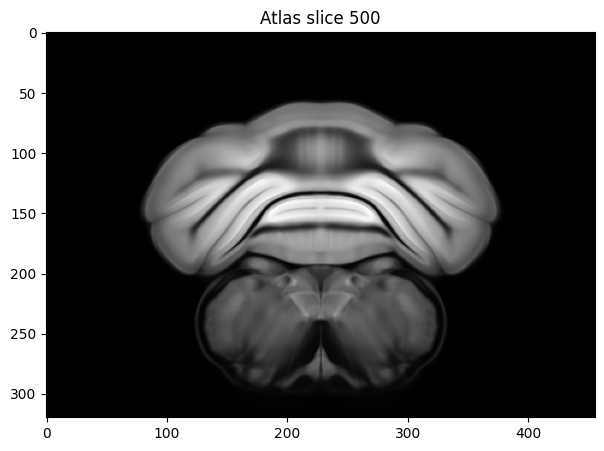

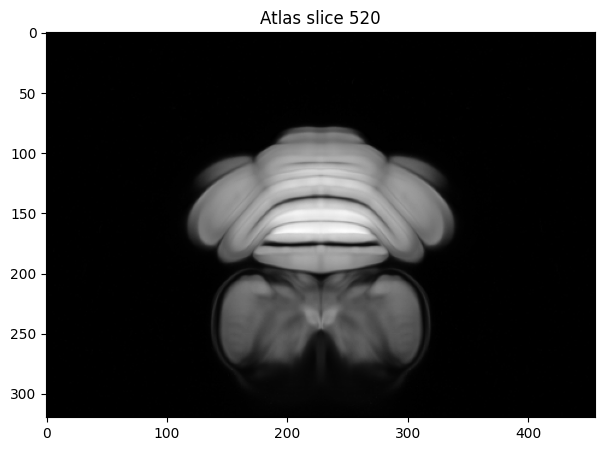

In [5]:
# Visualize atlas
for idx in range(0, atlas.shape[0], 20):
    show_slice(atlas, idx, title=f"Atlas slice {idx}")

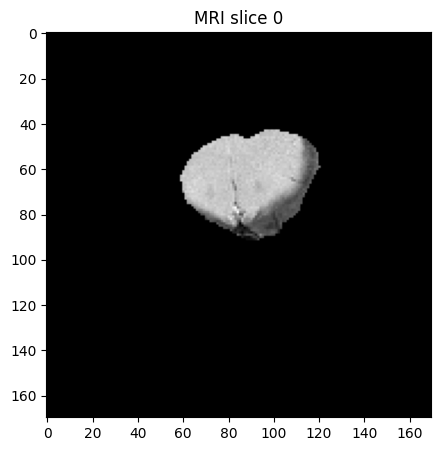

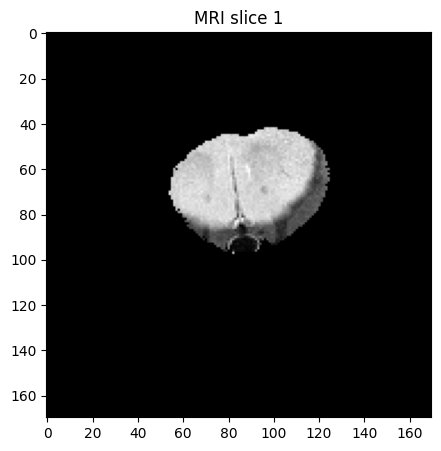

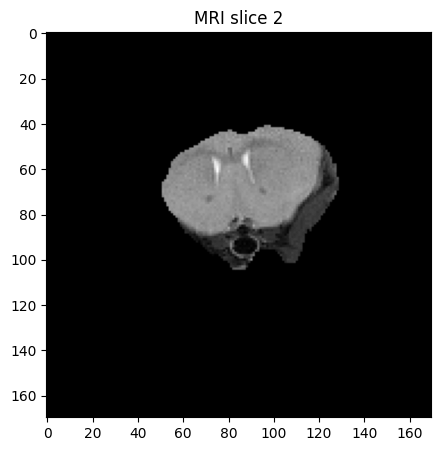

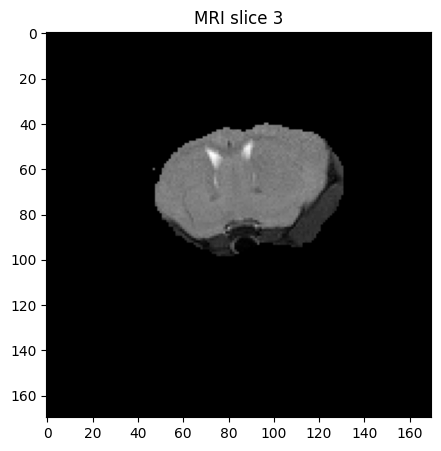

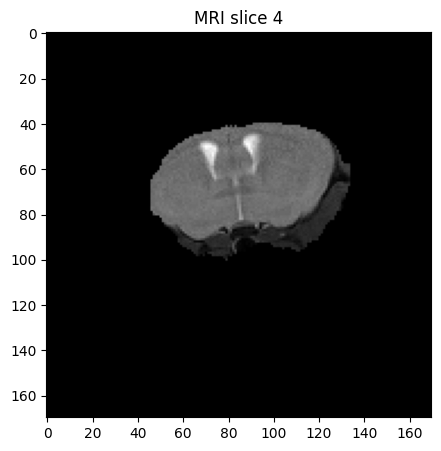

...

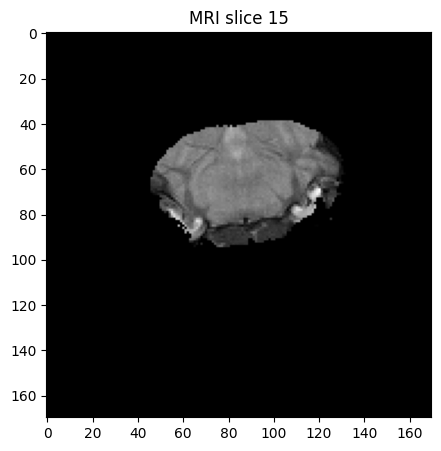

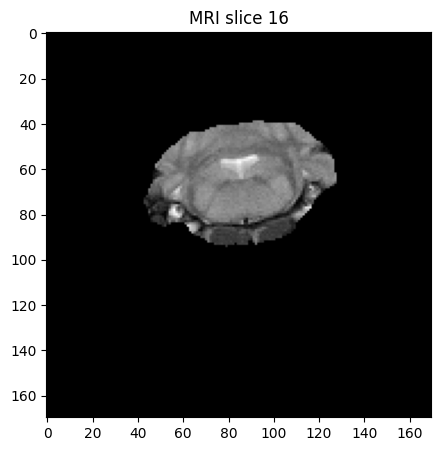

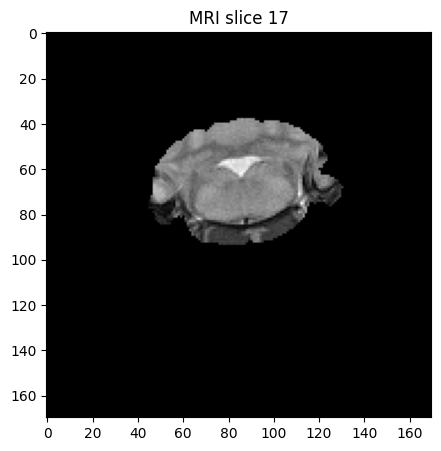

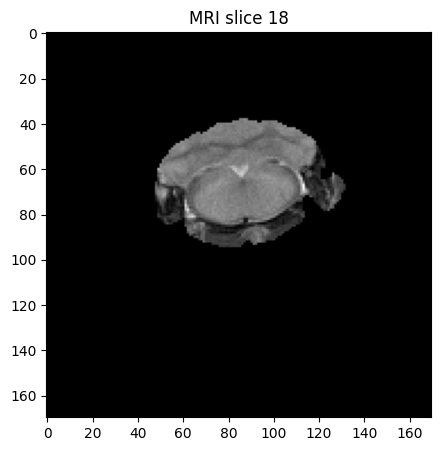

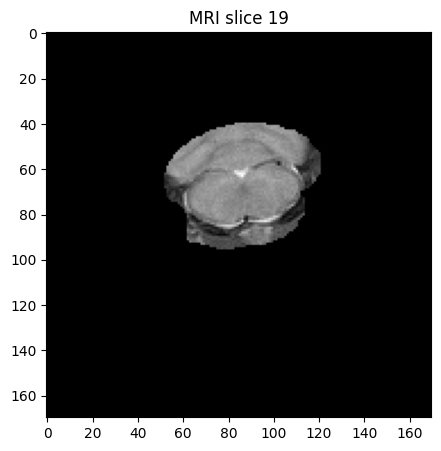

In [29]:
# Show index
for idx in range(0, data.shape[0]):
    show_slice(data, idx, f"MRI slice {idx}")
    
export_gif(data, "output/segmented_mri.gif", fps=6)

### Register to CCF (Full)

In [ ]:
output_path = "output/output.nii.gz"

# Run code for ANTs registration
print("Converting arrays to ANTs format...")
moving_image = ants.from_numpy(data)
fixed_image = ants.from_numpy(atlas)
print()

# Register Degu to atlas
print("Registering MRI AAVretro to atlas...")
result = ants.registration(fixed_image, moving_image, type_of_transform = 'SyN' )
print("Saving to", output_path)
# Save Moving image warped to space of fixed image
ants.image_write(result['warpedmovout'], output_path)
# Fixed image warped to space of moving image
#ants.image_write(result['warpedfixout'], output_path)
print("Done!\n")

# Register atlas to Degu
#print("Registering atlas to Degu...")
#result_inv = ants.registration(moving_image, fixed_image, type_of_transform = 'SyN' )
#print("Saving to", output_path_inv)
# Save Moving image warped to space of fixed image
#ants.image_write(result_inv['warpedmovout'], output_path_inv)
#print("Done!")

Converting arrays to ANTs format...

Registering MRI AAVretro to atlas...
Saving to output/output.nii.gz
Done!



#### Visualize result

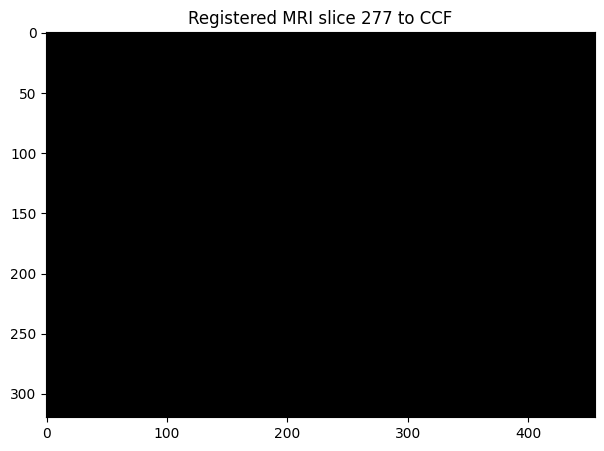

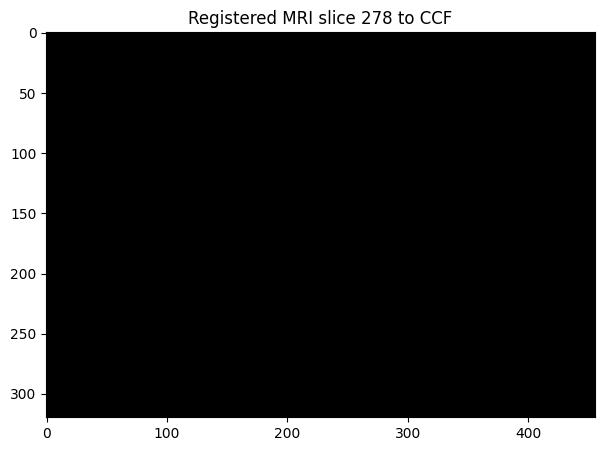

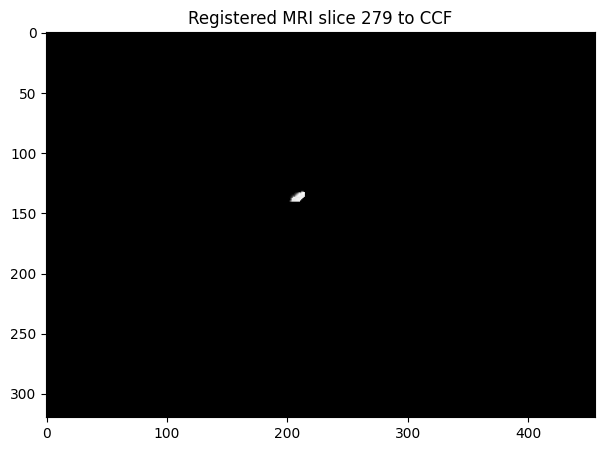

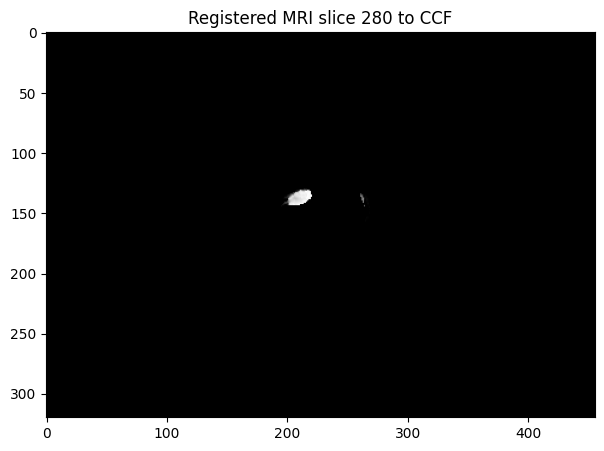

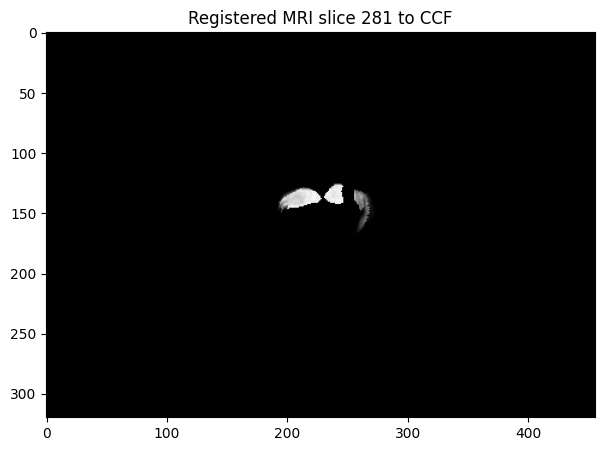

...

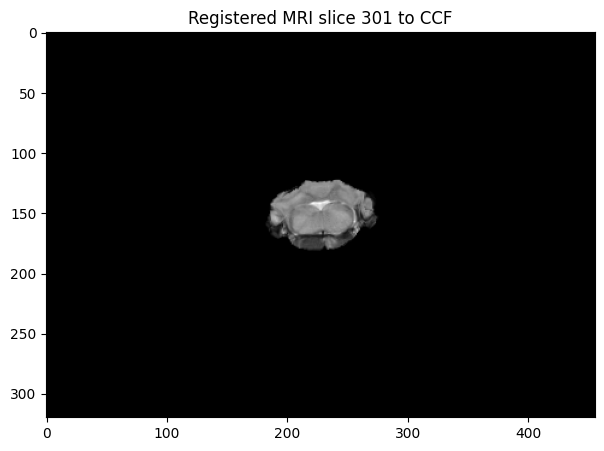

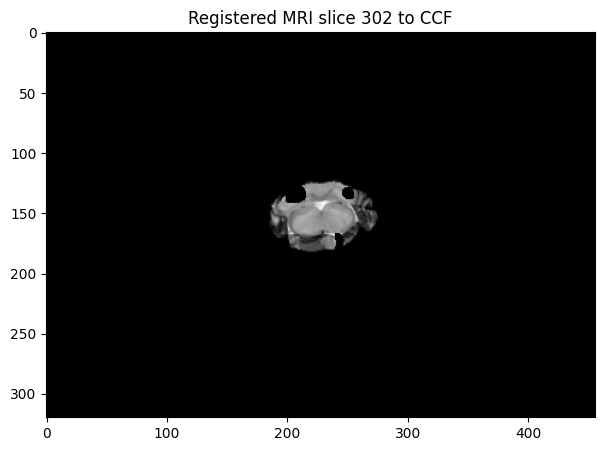

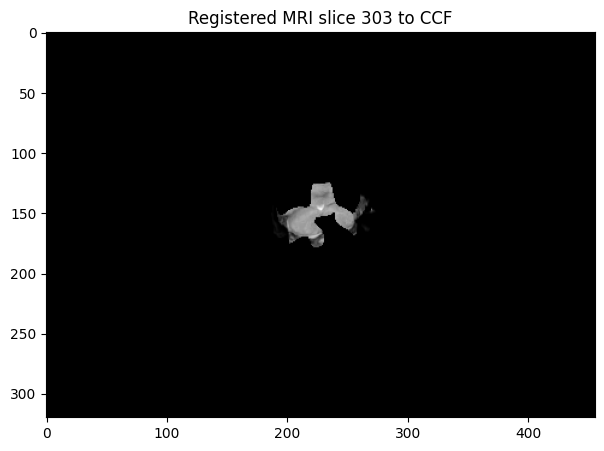

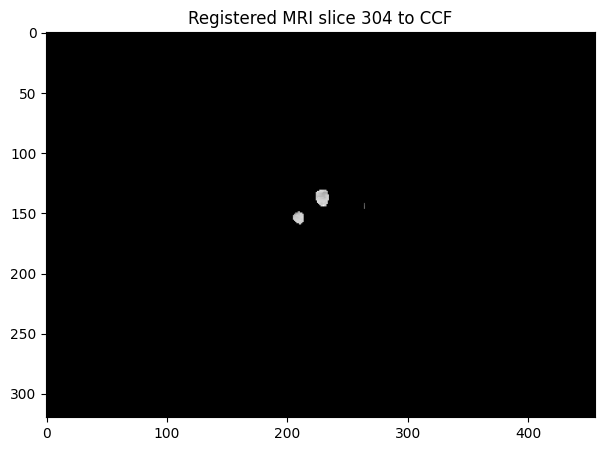

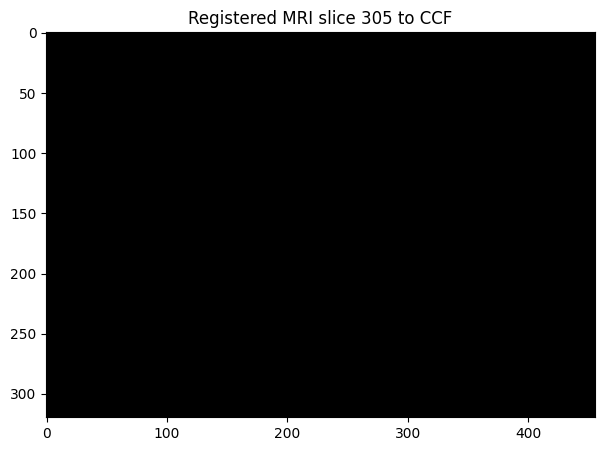

In [30]:
registered_data = nib.load(output_path).get_fdata()

# Show registered data
#for idx in range(0, registered_data.shape[0], 20):
#    show_slice(registered_data, idx, f"Registered MRI slice {idx} to CCF")
for idx in range(277, 306):
    show_slice(registered_data, idx, f"Registered MRI slice {idx} to CCF")
    
export_gif(registered_data[277:306], "output/registered_mri.gif", fps=6)

## Register to CCF (subset)

In [17]:
output_path = "output/output_subset.nii.gz"

atlas_subset = atlas[100:500:10, :, :]
annotation_subset = annotation[100:500:10, :, :]

# Run code for ANTs registration
print("Converting arrays to ANTs format...")
moving_image = ants.from_numpy(resized)
#moving_image = ants.from_numpy(data)
fixed_image = ants.from_numpy(atlas_subset)
print()

# Register Degu to atlas
print("Registering MRI AAVretro to atlas subset...")
result = ants.registration(fixed_image, moving_image, type_of_transform = 'SyN' )
print("Saving to", output_path)
# Save Moving image warped to space of fixed image
ants.image_write(result['warpedmovout'], output_path)
print("Done!\n")

Converting arrays to ANTs format...

Registering MRI AAVretro to atlas subset...
Saving to output/output_subset.nii.gz
Done!



Do the reverse mapping (invtransform)

In [ ]:
inv_output_path = "output/output_subset_inv.nii.gz"
inv_annotation_path = "output/output_subset_inv_annotation.nii.gz"

# Apply inverse transform to fixed image (atlas_subset)
warped_fixed = ants.apply_transforms(
    fixed=moving_image,           # target space: moving image
    moving=fixed_image,           # image to warp: fixed image (atlas_subset)
    transformlist=result['invtransforms'],
    interpolator='linear'
)
ants.image_write(warped_fixed, inv_output_path)

# Apply inverse transform to annotation (use nearest neighbor for labels)
annotation_ants = ants.from_numpy(annotation_subset)
warped_annotation = ants.apply_transforms(
    fixed=moving_image,
    moving=annotation_ants,
    transformlist=result['invtransforms'],
    interpolator='nearestNeighbor'
)
ants.image_write(warped_annotation, inv_annotation_path)

print("Inverse mapping done! Saved to", inv_output_path, "and", inv_annotation_path)

Inverse mapping done! Saved to output/output_subset_inv.nii.gz and output/output_subset_inv_annotation.nii.gz


In [25]:
warped_annotation_np = nib.load(inv_annotation_path).get_fdata()
registered_data = nib.load(inv_output_path).get_fdata()
export_gif_with_labels(resized, warped_annotation_np, "output/inv_mri_with_labels.gif", alpha=0.5, fps=6, fontsize=4)
export_gif_with_labels(registered_data, warped_annotation_np, "output/inv_atlas_with_labels.gif", alpha=0.5, fps=6, fontsize=4)

Do the reverse mapping (explicit)

In [16]:
output_path = "output/output_subset_inv.nii.gz"

start_idx = 100
end_idx = 500
skip_idx = 10

atlas_subset = atlas[start_idx:end_idx:skip_idx, :, :]
annotation_subset = annotation[start_idx:end_idx:skip_idx, :, :]

# Run code for ANTs registration
print("Converting arrays to ANTs format...")
moving_image = ants.from_numpy(resized)
#moving_image = ants.from_numpy(data)
fixed_image = ants.from_numpy(atlas_subset)
print()

# Register Degu to atlas
print("Registering atlas subset to MRI AAVretro...")
result = ants.registration(moving_image, fixed_image, type_of_transform = 'SyN' )
print("Saving to", output_path)
# Save Moving image warped to space of fixed image
ants.image_write(result['warpedmovout'], output_path)
print("Done!\n")

registered_data = nib.load(output_path).get_fdata()

# To apply the same transformation to another array (e.g., annotation_subset):
annotation_ants = ants.from_numpy(annotation_subset)

# Apply the transforms (use the same transforms as in registration)
warped_annotation = ants.apply_transforms(
    fixed=fixed_image, 
    moving=annotation_ants, 
    transformlist=result['fwdtransforms'],  # or 'invtransforms' for the reverse direction
    interpolator='nearestNeighbor'  # Use nearest for labels/annotations
)

# Convert back to numpy if needed
warped_annotation_np = warped_annotation.numpy()
export_gif_with_labels(resized, warped_annotation_np, "output/inv_mri_with_labels.gif", alpha=0.5, fps=6)
export_gif_with_labels(registered_data, warped_annotation_np, "output/inv_atlas_with_labels.gif", alpha=0.5, fps=6)

Converting arrays to ANTs format...

Registering atlas subset to MRI AAVretro...
Saving to output/output_subset_inv.nii.gz
Done!



### Visualize result

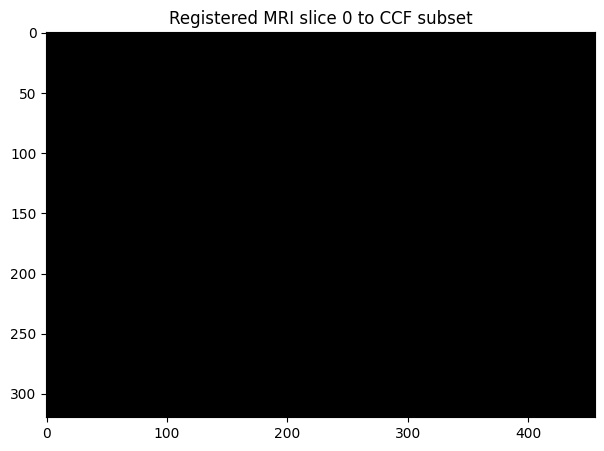

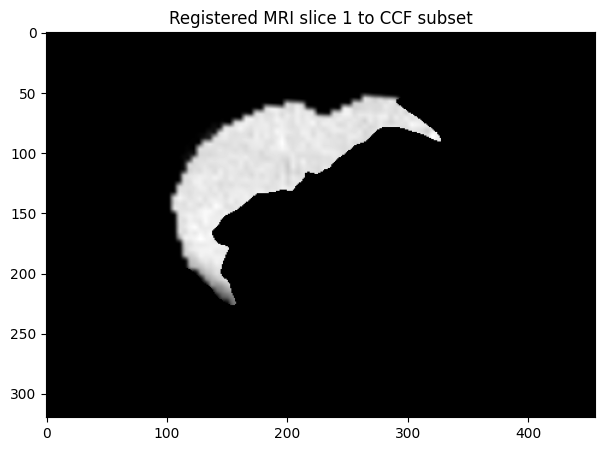

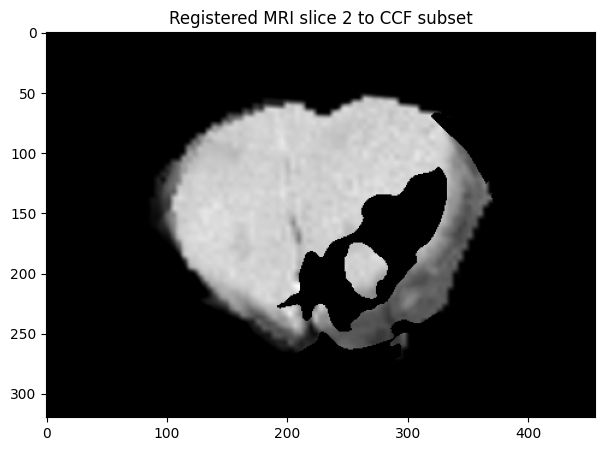

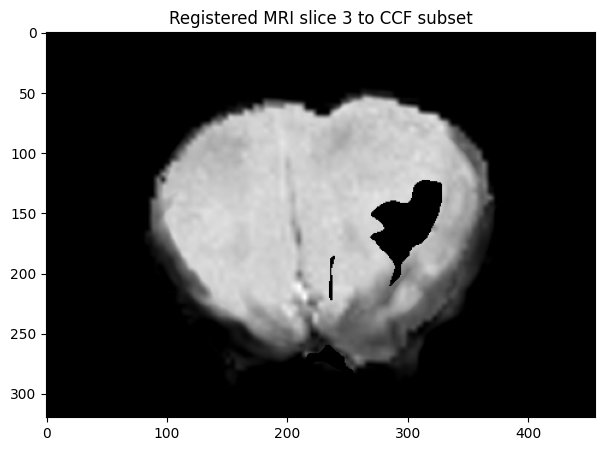

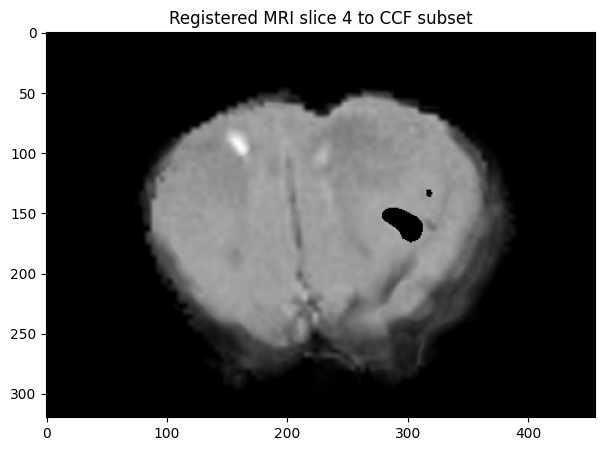

...

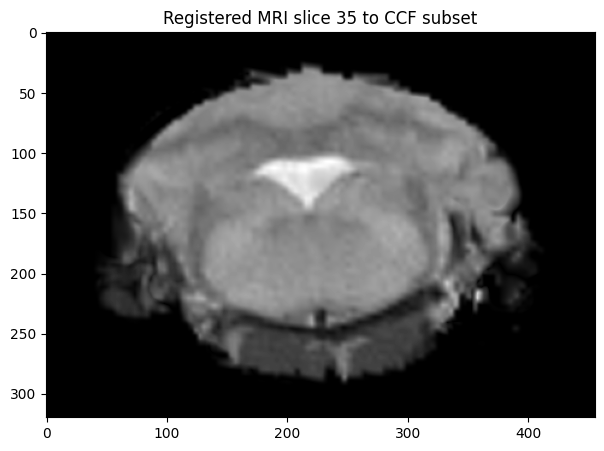

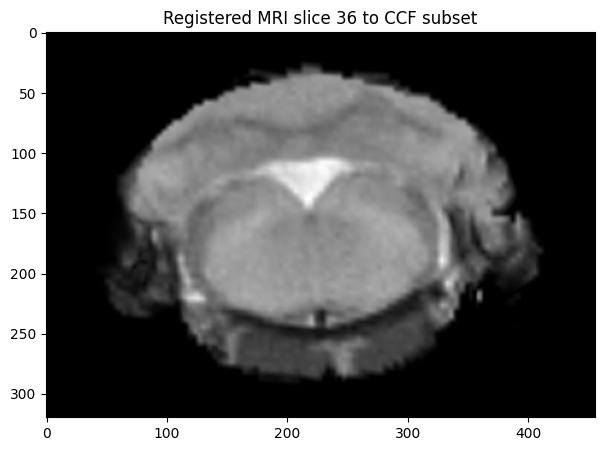

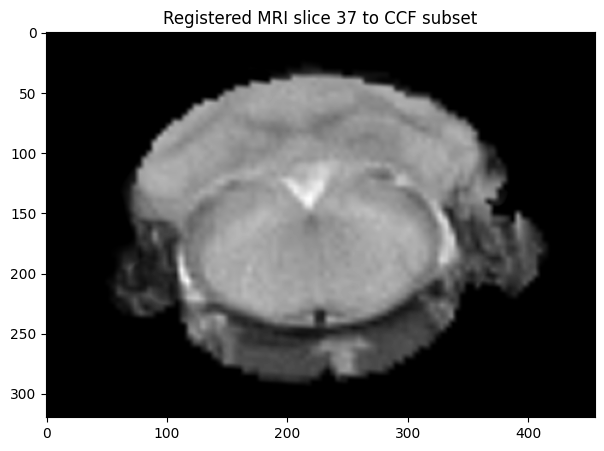

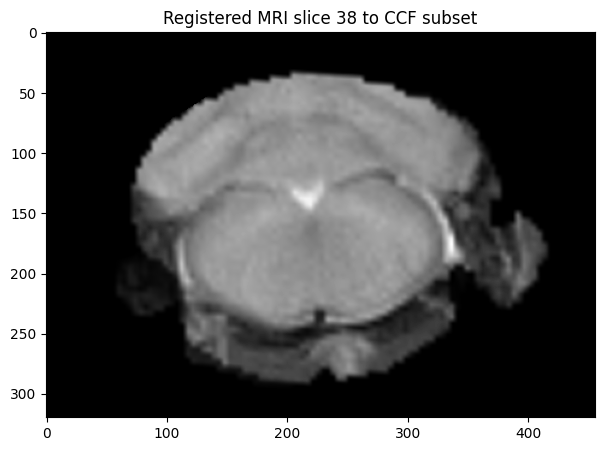

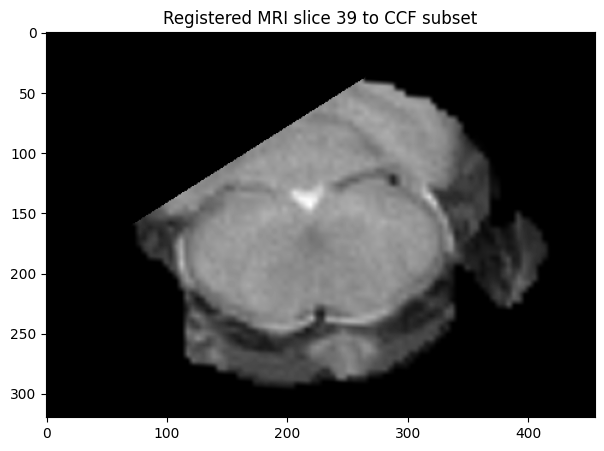

In [65]:
registered_data = nib.load(output_path).get_fdata()

# Show registered data
for idx in range(0, len(registered_data), 1):
    show_slice(registered_data, idx, f"Registered MRI slice {idx} to CCF subset")
    
export_gif(registered_data, "output/registered_mri_subset.gif", fps=6)

## Rabies M1

In [5]:
import nibabel as nib
from pprint import pprint
import numpy as np
import matplotlib.pyplot as plt

In [6]:
rabies_m1_brain_path = "../data/rabies_m1/brain_25.nii.gz"
rabies_m1_registered_path = "../data/rabies_m1/elastixRefined.nii.gz"
ccf_label_path = "../../../CCF_DATA/annotation_25.nii.gz"

rabies_m1_brain = nib.load(rabies_m1_brain_path).get_fdata()
rabies_m1_registered = nib.load(rabies_m1_registered_path).get_fdata()
ccf_labels = nib.load(ccf_label_path).get_fdata()

print("Rabies M1 brain shape:")
pprint(rabies_m1_brain.shape)
print("Rabies M1 registered shape:")
pprint(rabies_m1_registered.shape)
print("CCF labels shape:")
pprint(ccf_labels.shape)

Rabies M1 brain shape:
(300, 398, 523)
Rabies M1 registered shape:
(528, 320, 456)
CCF labels shape:
(528, 320, 456)


In [26]:
import cv2
from matplotlib.colors import ListedColormap
from scipy.ndimage import center_of_mass, label


def auto_contrast(data: np.ndarray, alpha: float = None, beta: float = None) -> np.ndarray:
    """
    Preprocess tiff files to automatically adjust brightness and contrast.
    https://stackoverflow.com/questions/56905592/automatic-contrast-and-brightness-adjustment-of-a-color-photo-of-a-sheet-of-pape
    """
    if not alpha:
        alpha = np.iinfo(data.dtype).max / (np.max(data) - np.min(data))
    if not beta:
        beta = -np.min(data) * alpha
    img = cv2.convertScaleAbs(data.copy(), alpha=alpha, beta=beta)
    return img


def show_4(idx: int, image: np.ndarray, labels: np.ndarray, alpha: float = None, title: str = ""):
    curr_img = image[idx, :, :]
    curr_label = labels[idx, :, :]
    # Apply auto contrast to the image
    if alpha is not None:
        curr_img = auto_contrast(curr_img, alpha=alpha)
    
    # Generate a custom colormap with enough unique colors
    unique_values = np.unique(curr_label)
    num_labels = len(unique_values)
    np.random.seed(142)  # For reproducibility
    colors = np.random.rand(num_labels - 1, 3)  # Generate random RGB colors
    colors = np.vstack([[0, 0, 0], colors])  # Ensure 0 is always black
    custom_cmap = ListedColormap(colors)

    # Registration output without overlay
    f, ax = plt.subplots(2, 2, figsize=(14, 14))
    ax[0][0].imshow(curr_img, cmap='gray')
    ax[0][0].set_title(title + f" (slice {idx})")
    ax[0][0].set_axis_off()

    # Registration output with overlay
    ax[0][1].imshow(curr_img, cmap='gray')
    # Overlay boundaries for each unique value in atlas_label
    for value in unique_values:
        if value == 0:  # Skip background
            continue
        ax[0][1].contour(curr_label == value, 
                    levels=[0.5], colors='r', linewidths=1, alpha=0.5)
        ax[1][0].contour(curr_label == value, 
                    levels=[0.5], colors='r', linewidths=1, alpha=0.5)
        ax[1][1].contour(curr_label == value, 
                    levels=[0.5], colors='black', linewidths=1, alpha=0.5)
        
        # Compute the center of mass for the current label
        mask = curr_label == value
        # Label connected components in the mask
        labeled_components, num_components = label(mask)

        # Compute the center of mass for each connected component
        for component_idx in range(1, num_components + 1):
            component_mask = labeled_components == component_idx
            center = center_of_mass(component_mask)

            # Add the label index at the center of the region
            ax[0][1].text(center[1], center[0], str(int(value)), color='white', fontsize=6, ha='center', va='center')
            ax[1][1].text(center[1], center[0], str(int(value)), color='white', fontsize=6, ha='center', va='center')


        
    ax[0][1].imshow(curr_label, cmap=custom_cmap, alpha=0.5)  # Use a colormap like 'tab20'
    ax[0][1].set_title(title + f" with labels (slice {idx})")
    ax[0][1].set_axis_off()

    # Rat atlas slice
    ax[1][0].imshow(curr_img, cmap='gray')
    ax[1][0].set_title(title + f" with label outlines (slice {idx})")
    ax[1][0].set_axis_off()

    # Rat atlas labels
    ax[1][1].imshow(curr_label, cmap=custom_cmap, alpha=1)
    ax[1][1].set_title(f"Allen mouse CCF labels (slice {idx})")
    ax[1][1].set_axis_off()

    plt.tight_layout()
    plt.subplots_adjust(hspace=-0.4)
    plt.show()
    f.clear()
    plt.close(f)

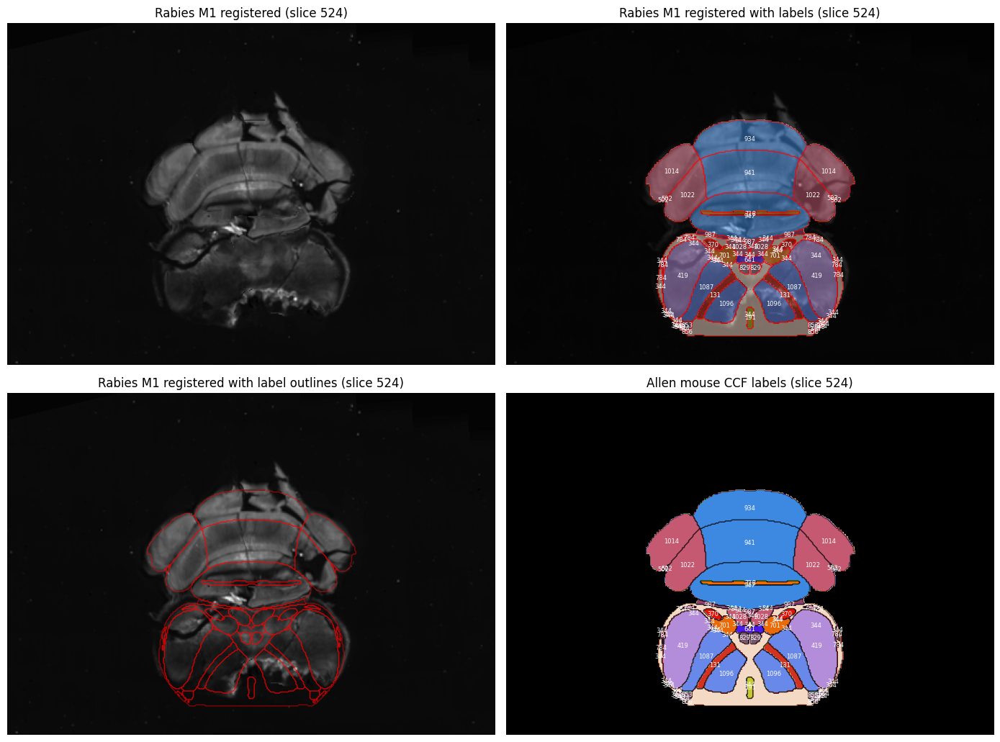

In [35]:
idx = 524  # Try 450 and 500

show_4(idx, rabies_m1_registered, ccf_labels, alpha=0.25, title="Rabies M1 registered")

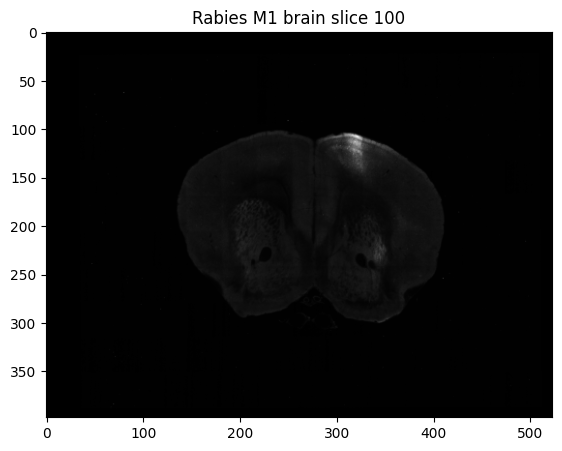

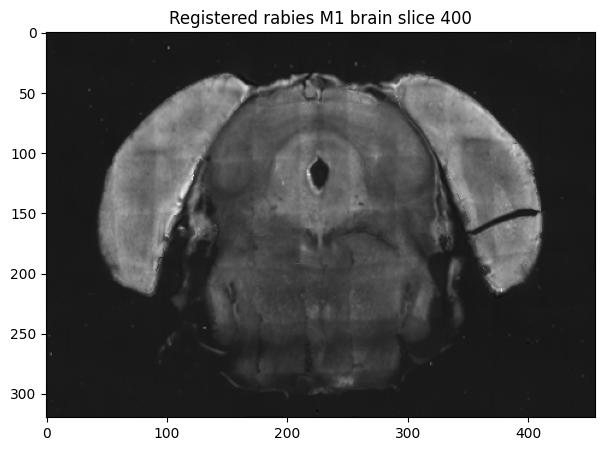

In [60]:
idx1 = 100
idx2 = 400

show_slice(rabies_m1_brain, idx1, f"Rabies M1 brain slice {idx1}")
show_slice(rabies_m1_registered, idx2, f"Registered rabies M1 brain slice {idx2}")